In [2]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import pi
import re
from scipy.stats.mstats import mode
from datetime import datetime, date
import seaborn as sns
import warnings
%load_ext google.colab.data_table
from google.colab import drive
drive.mount('/content/drive')

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
#make my csv file work!
#for the first question, what are the most dangerous types of sharks to humans?
data = pd.read_csv('/content/drive/MyDrive/sharkattacks.csv', encoding = 'cp1252')
data

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,...,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,...,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,...,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25719,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Create the dataframe
df = pd.DataFrame(data)
  
# Apply the function
df['Case Number']=df['Case Number'].replace('0', np.nan)
df= df.dropna(how='all')
  
# print the DataFrame
df

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,...,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,...,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,...,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6307.0,NaN,NaN
6306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6308.0,NaN,NaN
6307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6309.0,NaN,NaN
6308,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6310.0,NaN,NaN


In [5]:
#df as string
df=df.astype(str)

In [6]:
#lower letters in rows
df = df.applymap(lambda x: x.lower() if pd.notnull(x) else x)

In [7]:
#lower letters columns
df = df.rename(columns=lambda x: x.strip().lower())

In [8]:
#as the 2 previous columns had allmost all values null and we checked the 3 doubts we had, we eliminate them
#also, we delete columns which will not help us to answer the questions we formulated
df = df.drop(axis = 1, columns = ['case number', 'date', 'investigator or source','pdf', 'href formula', 'href', 'original order', 'area', 'location', 'injury', 'time', 'case number.1',	'case number.2',	'unnamed: 22',	'unnamed: 23'])
df

,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,white shark
1,2018.0,unprovoked,usa,standing,adyson mcneely,f,11,n,nan
2,2018.0,invalid,usa,surfing,john denges,m,48,n,nan
3,2018.0,unprovoked,australia,surfing,male,m,nan,n,2 m shark
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,"tiger shark, 3m"
...,...,...,...,...,...,...,...,...,...
6305,nan,nan,nan,nan,nan,nan,nan,nan,nan
6306,nan,nan,nan,nan,nan,nan,nan,nan,nan
6307,nan,nan,nan,nan,nan,nan,nan,nan,nan
6308,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [9]:
#check stripping columns
df.columns

Index(['year', 'type', 'country', 'activity', 'name', 'sex', 'age',
       'fatal (y/n)', 'species'],
      dtype='object')

In [10]:
#I think the "year" column is important for an analysis. Let's check what it contains..
set(df['year'].sample(n=30))

{'0.0',
 '1855.0',
 '1862.0',
 '1863.0',
 '1895.0',
 '1899.0',
 '1900.0',
 '1932.0',
 '1936.0',
 '1940.0',
 '1943.0',
 '1957.0',
 '1958.0',
 '1962.0',
 '1963.0',
 '1965.0',
 '1980.0',
 '1987.0',
 '1996.0',
 '1997.0',
 '2003.0',
 '2006.0',
 '2008.0',
 '2009.0',
 '2015.0',
 '2016.0',
 '2017.0'}

In [11]:
#"Type" column
set(df['type'])

{'boat',
 'boating',
 'boatomg',
 'invalid',
 'nan',
 'provoked',
 'questionable',
 'sea disaster',
 'unprovoked'}

In [12]:
#df test
#import libraries
from datetime import datetime, date
import seaborn
from scipy.stats.mstats import mode
df_fish = df.copy() 
df_fish

,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,white shark
1,2018.0,unprovoked,usa,standing,adyson mcneely,f,11,n,nan
2,2018.0,invalid,usa,surfing,john denges,m,48,n,nan
3,2018.0,unprovoked,australia,surfing,male,m,nan,n,2 m shark
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,"tiger shark, 3m"
...,...,...,...,...,...,...,...,...,...
6305,nan,nan,nan,nan,nan,nan,nan,nan,nan
6306,nan,nan,nan,nan,nan,nan,nan,nan,nan
6307,nan,nan,nan,nan,nan,nan,nan,nan,nan
6308,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [13]:
df_fish = df_fish[df_fish.loc[:]!=0].dropna()

In [14]:
#drop duplicates
df_fish = df.drop_duplicates(subset=list(df.columns))
print(df.shape)
df_fish

(6310, 9)


,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,white shark
1,2018.0,unprovoked,usa,standing,adyson mcneely,f,11,n,nan
2,2018.0,invalid,usa,surfing,john denges,m,48,n,nan
3,2018.0,unprovoked,australia,surfing,male,m,nan,n,2 m shark
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,"tiger shark, 3m"
...,...,...,...,...,...,...,...,...,...
6298,0.0,unprovoked,australia,pearl diving,ahmun,m,nan,y,nan
6299,0.0,unprovoked,usa,swimming,coast guard personnel,m,nan,y,nan
6300,0.0,unprovoked,panama,nan,jules patterson,m,nan,y,nan
6301,0.0,unprovoked,ceylon (sri lanka),swimming,male,m,15,y,nan


In [15]:
#Test columns, see if species still in the column
df_fish.columns

Index(['year', 'type', 'country', 'activity', 'name', 'sex', 'age',
       'fatal (y/n)', 'species'],
      dtype='object')

In [16]:
#See how much zero's and NaN's are in the columns
df_fish['species'].isna().sum()

0

In [17]:
df_fish.isnull().sum()

year           0
type           0
country        0
activity       0
name           0
sex            0
age            0
fatal (y/n)    0
species        0
dtype: int64

In [18]:
#species count
df_fish.species.value_counts()
df_fish

,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,white shark
1,2018.0,unprovoked,usa,standing,adyson mcneely,f,11,n,nan
2,2018.0,invalid,usa,surfing,john denges,m,48,n,nan
3,2018.0,unprovoked,australia,surfing,male,m,nan,n,2 m shark
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,"tiger shark, 3m"
...,...,...,...,...,...,...,...,...,...
6298,0.0,unprovoked,australia,pearl diving,ahmun,m,nan,y,nan
6299,0.0,unprovoked,usa,swimming,coast guard personnel,m,nan,y,nan
6300,0.0,unprovoked,panama,nan,jules patterson,m,nan,y,nan
6301,0.0,unprovoked,ceylon (sri lanka),swimming,male,m,15,y,nan


In [19]:
#show dataframe year
df_fish = pd.DataFrame(df_fish, columns =['year'])
display(df_fish)

,year
0,2018.0
1,2018.0
2,2018.0
3,2018.0
4,2018.0
...,...
6298,0.0
6299,0.0
6300,0.0
6301,0.0


In [20]:
#rename sharks
df_fish = df
df['species'][df['species'].str.contains('white', na=False)] = 'whity'
df['species'][df['species'].str.contains('cookiecutter', na=False)] = 'cookiecutter'
df['species'][df['species'].str.contains("reef", na=False)] = 'reef'
df['species'][df['species'].str.contains('blacktip', na=False)] = 'blacktip'
df['species'][df['species'].str.contains('whaler', na=False)] = 'whaler'
df['species'][df['species'].str.contains('mako', na=False)] = 'mako'
df['species'][df['species'].str.contains('wobbegong', na=False)] = 'wobbegong'
df['species'][df['species'].str.contains('raggedtooth', na=False)] = 'raggedtooth'
df['species'][df['species'].str.contains('spinner', na=False)] = 'spinner'
df['species'][df['species'].str.contains('lemon', na=False)] = 'lemon'
df['species'][df['species'].str.contains('blue', na=False)] = 'blue'
df['species'][df['species'].str.contains('sand', na=False)] = 'sand'
df['species'][df['species'].str.contains('zambesi', na=False)] = 'zambesi'
df['species'][df['species'].str.contains('bull', na=False)] = 'bully'
df['species'][df['species'].str.contains('tiger', na=False)] = 'tiger'
df['species'][df['species'].str.contains('whitetip', na=False)] = 'whitetip'
df['species'][df['species'].str.contains('hammerhead', na=False)] = 'hammer'
df['species'][df['species'].str.contains('gill', na=False)] = 'gill'
df['species'][df['species'].str.contains('dusky', na=False)] = 'dusky'
df['species'][df['species'].str.contains('carpet', na=False)] = 'carpet'
df['species'][df['species'].str.contains('dog', na=False)] = 'dog'
df['species'][df['species'].str.contains('angel', na=False)] = 'angel'
df['species'][df['species'].str.contains('porbeagle', na=False)] = 'porbeagle'
df['species'][df['species'].str.contains('colored', na=False)] = 'colored'
df['species'][df['species'].str.contains('basking', na=False)] = 'basking'
df['species'][df['species'].str.contains('galapagos', na=False)] = 'galapagos'
df['species'][df['species'].str.contains('copper', na=False)] = 'copper'
df['species'][df['species'].str.contains('reef', na=False)] = 'reef'
df['species'][df['species'].str.contains('blacktip', na=False)] = 'blacktip'
df['species'][df['species'].str.contains('spinner', na=False)] = 'spinner'
df['species'][df['species'].str.contains('lemon', na=False)] = 'lemon'
df['species'][df['species'].str.contains('blue', na=False)] = 'blue'
df['species'][df['species'].str.contains('nurse', na=False)] = 'nurse'
df['species'][df['species'].str.contains('ground', na=False)] = 'groundy'
df['species'][df['species'].str.contains('pointer', na=False)] = 'pointers'
df['species'][df['species'].str.contains('pointers', na=False)] = 'pointers'
df['species'][df['species'].str.contains('leopard', na=False)] = 'leopard'
df['species'][df['species'].str.contains('questionable', na=False)]= 'unknown'
df['species'][df['species'].str.contains('unidentified', na=False)] = 'unknown'
df['species'][df['species'].str.contains('15', na=False)] = 'unknown'
df

,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,whity
1,2018.0,unprovoked,usa,standing,adyson mcneely,f,11,n,nan
2,2018.0,invalid,usa,surfing,john denges,m,48,n,nan
3,2018.0,unprovoked,australia,surfing,male,m,nan,n,2 m shark
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,tiger
...,...,...,...,...,...,...,...,...,...
6305,nan,nan,nan,nan,nan,nan,nan,nan,nan
6306,nan,nan,nan,nan,nan,nan,nan,nan,nan
6307,nan,nan,nan,nan,nan,nan,nan,nan,nan
6308,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [21]:
#group names shark
df=df[df["species"].str.contains(" ") == False]
df

,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,whity
1,2018.0,unprovoked,usa,standing,adyson mcneely,f,11,n,nan
2,2018.0,invalid,usa,surfing,john denges,m,48,n,nan
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,tiger
5,2018.0,unprovoked,australia,kite surfing,chris …,m,nan,n,nan
...,...,...,...,...,...,...,...,...,...
6305,nan,nan,nan,nan,nan,nan,nan,nan,nan
6306,nan,nan,nan,nan,nan,nan,nan,nan,nan
6307,nan,nan,nan,nan,nan,nan,nan,nan,nan
6308,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [22]:
#remove nan's and other non info species
df['species']=df['species'].replace(['nan', 'unknown', 'invalid'], np.nan)
df= df.dropna(subset=['species'])
df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,whity
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,tiger
6,2018.0,unprovoked,brazil,swimming,jose ernesto da silva,m,18,y,tiger
7,2018.0,unprovoked,usa,fishing,male,m,52,n,lemon
8,2018.0,unprovoked,usa,walking,cody high,m,15,n,bully
...,...,...,...,...,...,...,...,...,...
6276,0.0,unprovoked,belize,standing,a servant,m,16,y,tiger
6293,0.0,unprovoked,australia,fishing,boy,m,nan,y,blue
6294,0.0,unprovoked,australia,fishing,fisherman,m,nan,y,blue
6295,0.0,unprovoked,australia,fishing,fisherman,m,nan,y,blue


In [23]:
#filter fatal (y/n)
df['fatal (y/n)']=df['fatal (y/n)'].replace(['nan', 'unknown', '2017', 'm', ' n'], np.nan)
df= df.dropna(subset=['fatal (y/n)'])
df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,year,type,country,activity,name,sex,age,fatal (y/n),species
0,2018.0,boating,usa,paddling,julie wolfe,f,57,n,whity
4,2018.0,provoked,mexico,free diving,gustavo ramos,m,nan,n,tiger
6,2018.0,unprovoked,brazil,swimming,jose ernesto da silva,m,18,y,tiger
7,2018.0,unprovoked,usa,fishing,male,m,52,n,lemon
8,2018.0,unprovoked,usa,walking,cody high,m,15,n,bully
...,...,...,...,...,...,...,...,...,...
6276,0.0,unprovoked,belize,standing,a servant,m,16,y,tiger
6293,0.0,unprovoked,australia,fishing,boy,m,nan,y,blue
6294,0.0,unprovoked,australia,fishing,fisherman,m,nan,y,blue
6295,0.0,unprovoked,australia,fishing,fisherman,m,nan,y,blue


In [24]:
# sorting data frame by name
df.sort_values("species", axis = 0, ascending = True,
                 inplace = True, na_position ='first')
 
df
# display

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,year,type,country,activity,name,sex,age,fatal (y/n),species
5398,1910.0,provoked,north atlantic ocean,fishing,tham key,m,nan,n,angel
249,2016.0,unprovoked,spain,wading,female,f,10,n,angel
1083,2009.0,provoked,scotland,diving,male,m,23,n,angel
1457,2006.0,unprovoked,usa,standing,dallas jackson,m,49,n,angel
1011,2010.0,provoked,spain,swimming,male,m,9,n,angel
...,...,...,...,...,...,...,...,...,...
1060,2009.0,unprovoked,mozambique,swimming,peter fraser,m,27,n,zambesi
1886,2002.0,unprovoked,south africa,fishing,imraan sheik,m,16,n,zambesi
3773,1963.0,boat,mozambique,nan,"canoe, occupant: jopie averes",nan,nan,n,zambesi
3864,1961.0,unprovoked,south africa,treading water,glynn wessels,m,18,n,zambesi


In [25]:
from pandas.core.groupby.groupby import DataFrame
# sorting data frame by name
df.sort_values("species", axis = 0, ascending = True,
                 inplace = True, na_position ='last')
 
# display
df

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,year,type,country,activity,name,sex,age,fatal (y/n),species
5398,1910.0,provoked,north atlantic ocean,fishing,tham key,m,nan,n,angel
249,2016.0,unprovoked,spain,wading,female,f,10,n,angel
1083,2009.0,provoked,scotland,diving,male,m,23,n,angel
1457,2006.0,unprovoked,usa,standing,dallas jackson,m,49,n,angel
1011,2010.0,provoked,spain,swimming,male,m,9,n,angel
...,...,...,...,...,...,...,...,...,...
3771,1963.0,unprovoked,south africa,spearfishing,clive passmore,m,24,n,zambesi
3075,1980.0,provoked,south africa,spearfishing,les winkworth,m,29,n,zambesi
3864,1961.0,unprovoked,south africa,treading water,glynn wessels,m,18,n,zambesi
3592,1966.0,unprovoked,south africa,standing,robin michael long,m,16,n,zambesi


In [26]:
# sorting data frame by name
df.sort_values("fatal (y/n)", axis = 0, ascending = False,
                 inplace = True, na_position ='last')
 
# display
df

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,year,type,country,activity,name,sex,age,fatal (y/n),species
4385,1953.0,unprovoked,papua new guinea,went over side of boat at trochus ground,captain of cutter hetabu,m,nan,y,tiger
3514,1967.0,unprovoked,australia,"spearfishing, dived to pick up a float line",robert bartle,m,23,y,whity
1806,2002.0,unprovoked,australia,swimming,beau martin,m,23,y,bully
4482,1950.0,unprovoked,south africa,body surfing,clive dumayne,m,14,y,whity
1798,2003.0,unprovoked,australia,swimming,bob purcell,m,84,y,bully
...,...,...,...,...,...,...,...,...,...
1185,2008.0,provoked,south africa,fishing,luke parker,m,15,n,raggedtooth
1622,2004.0,unprovoked,south africa,playing,arno de bruyn,m,16,n,raggedtooth
3997,1960.0,provoked,south africa,fishing,p. wagener,m,nan,n,raggedtooth
3390,1970.0,provoked,south africa,scuba diving,anand govindsamy,m,25,n,raggedtooth


In [27]:
#Sort species
species = pd.crosstab(index=df.species[df.species!="species"], columns=df["fatal (y/n)"]).sort_values("n",ascending=False)
species

fatal (y/n),n,y
species,,
whity,503,150
tiger,182,68
bully,137,38
nurse,92,1
blacktip,87,0
whaler,67,7
reef,65,0
mako,53,2
wobbegong,48,0


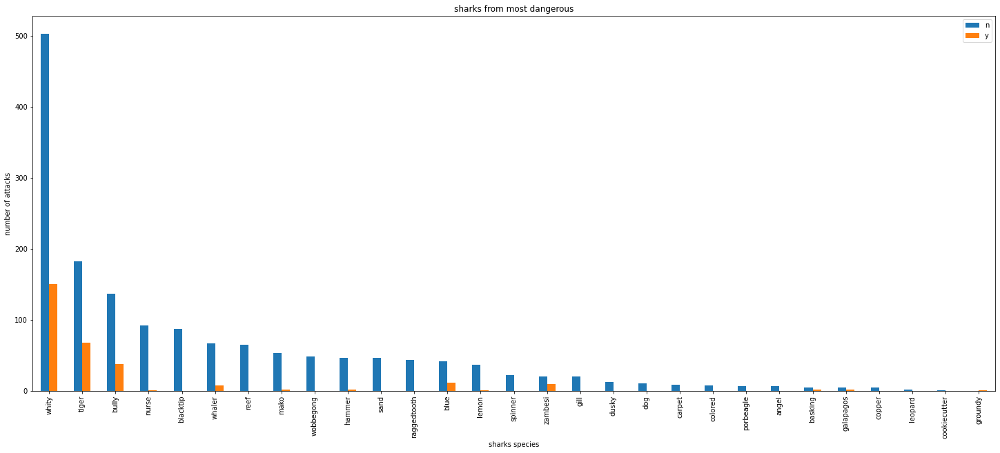

In [28]:
#use plot to show result shark attacks
#this statics show that the most dangerous shark is the white shark
species.plot(title = "sharks from most dangerous", xlabel= 'sharks species', ylabel='number of attacks', kind = "bar", figsize = (25,10))
plt.legend()

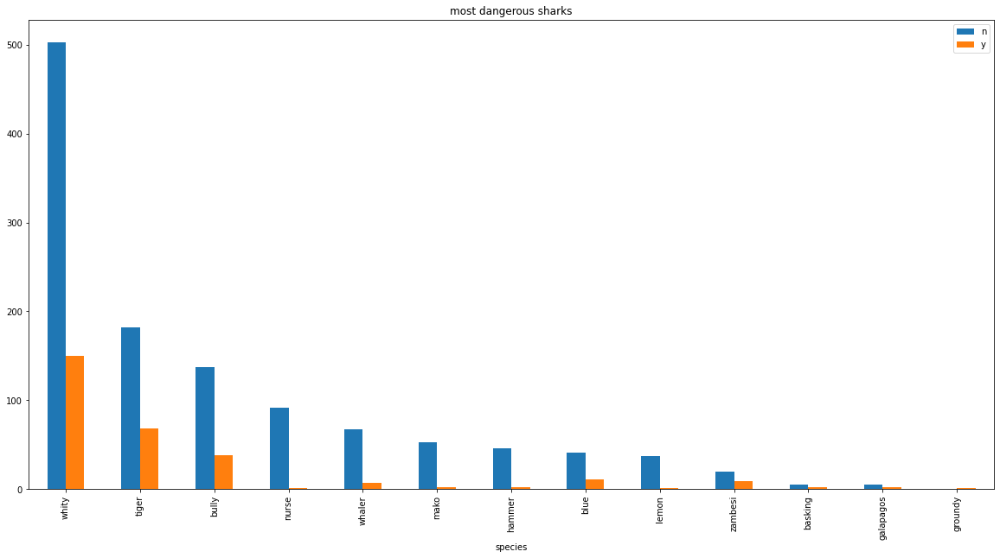

In [29]:
#Extra plot for more clear data shark attacks
#Sometimes they ask for more statics to make it more clear for all the people who are interested in statics about sharks
species[species.y>0].plot(title = "most dangerous sharks", kind = "bar", figsize = (20,10))
plt.legend()

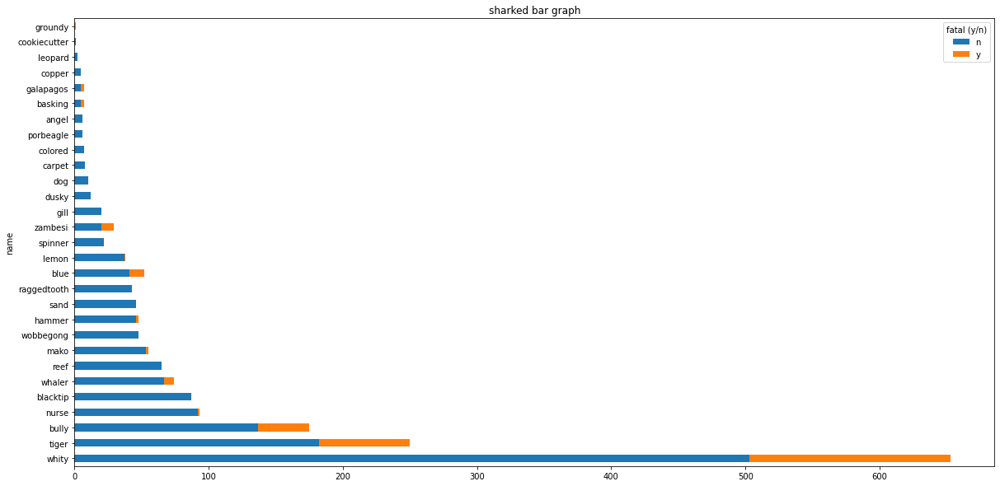

In [30]:
# also make a  bar chart using matplotlib
species.plot(
    xlabel = 'name',
    ylabel = 'percentage of attacks',
    kind = 'barh',
    figsize = (20,10),
    stacked = True,
    title = 'sharked bar graph',
    mark_right = True)
    

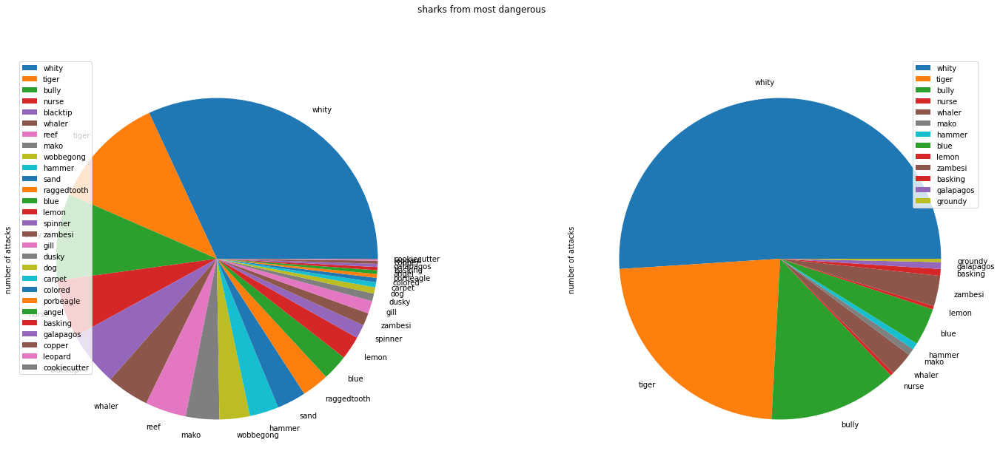

In [31]:
#use plot to show result shark attacks
#and kids like pie to
species.plot(title = "sharks from most dangerous", xlabel= 'sharks species', ylabel='number of attacks', kind = "pie", subplots=True, figsize = (25,10))
plt.legend()

In [32]:
#filter age
df["age"]=df[("age")].replace(['nan'], np.nan)
df= df.dropna(subset=["age"])
df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,year,type,country,activity,name,sex,age,fatal (y/n),species
3514,1967.0,unprovoked,australia,"spearfishing, dived to pick up a float line",robert bartle,m,23,y,whity
1806,2002.0,unprovoked,australia,swimming,beau martin,m,23,y,bully
4482,1950.0,unprovoked,south africa,body surfing,clive dumayne,m,14,y,whity
1798,2003.0,unprovoked,australia,swimming,bob purcell,m,84,y,bully
2019,2000.0,unprovoked,usa,jumped into the water,thaddeus kubinski,m,69,y,bully
...,...,...,...,...,...,...,...,...,...
2180,1998.0,unprovoked,south africa,surfing,mark thomas,m,10,n,raggedtooth
1185,2008.0,provoked,south africa,fishing,luke parker,m,15,n,raggedtooth
1622,2004.0,unprovoked,south africa,playing,arno de bruyn,m,16,n,raggedtooth
3390,1970.0,provoked,south africa,scuba diving,anand govindsamy,m,25,n,raggedtooth


In [33]:
#filter dataframe using only a specific column
new = df.filter(['age'], axis=1)
new

,age
3514,23
1806,23
4482,14
1798,84
2019,69
...,...
2180,10
1185,15
1622,16
3390,25


In [34]:
#add a new column
new['agegroup']= ''
new

,age,agegroup
3514,23,
1806,23,
4482,14,
1798,84,
2019,69,
...,...,...
2180,10,
1185,15,
1622,16,
3390,25,


In [35]:
#rename ages
new['age'][new['age'].str.contains('>50', na=False)] = '51'
new['age'][new['age'].str.contains('13 or 14', na=False)] = '14'
new['age'][new['age'].str.contains('13 or 18', na=False)] = '15'
new['age'][new['age'].str.contains('7 or 8', na=False)] = '8'
new['age'][new['age'].str.contains('20s', na=False)] = '21'
new['age'][new['age'].str.contains('30 or 36', na=False)] = '33'
new['age'][new['age'].str.contains('18 or 20', na=False)] = '19'
new['age'][new['age'].str.contains('32 & 30', na=False)] = '31'
new['age'][new['age'].str.contains('40s', na=False)] = '41'
new['age'][new['age'].str.contains('9 or 10', na=False)] = '10'
new['age'][new['age'].str.contains('9 & 12', na=False)] = '11'
new['age'][new['age'].str.contains('30s', na=False)] = '31'
new['age'][new['age'].str.contains('18months', na=False)] = '1'
new['age'][new['age'].str.contains('30 to 35', na=False)] = '32'

In [36]:
#filter age
new["age"]=new[("age")].replace([' ', 'adult', 'teen', 'kid'], np.nan)
new= new.dropna(subset=["age"])
new

,age,agegroup
3514,23,
1806,23,
4482,14,
1798,84,
2019,69,
...,...,...
2180,10,
1185,15,
1622,16,
3390,25,


In [37]:
#seperate ages kids and adult
new.loc[(new.age <= '17'), 'agegroup'] = 'kid'
new.loc[(new.age >= '18'), 'agegroup'] = 'adult'
new

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


,age,agegroup
3514,23,adult
1806,23,adult
4482,14,kid
1798,84,adult
2019,69,adult
...,...,...
2180,10,kid
1185,15,kid
1622,16,kid
3390,25,adult


In [38]:
#sort index ages
new.sort_index(axis=1)

,age,agegroup
3514,23,adult
1806,23,adult
4482,14,kid
1798,84,adult
2019,69,adult
...,...,...
2180,10,kid
1185,15,kid
1622,16,kid
3390,25,adult


In [39]:
#value counts ages
new["agegroup"].value_counts()

adult    1040
kid       234
Name: agegroup, dtype: int64

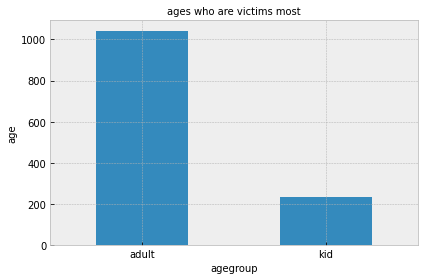

In [40]:
#make a bar plot ages and agegroup
#showing this stats below you can see clearly that shark also like more meat instead of less meat, unless you give your child more food
fs = 10
plt.style.use("bmh")
fig = plt.figure()

ax0 = plt.subplot(1, 1, 1)
new['agegroup'].value_counts().plot(kind="bar", ax=ax0)
ax0.set_xlabel("agegroup", fontsize=fs)
ax0.set_ylabel("age", fontsize=fs)
ax0.tick_params(axis='both', labelsize=fs)
ax0.tick_params(axis='x', labelrotation=00)
ax0.set_title("ages who are victims most", fontsize=fs)
plt.tight_layout()

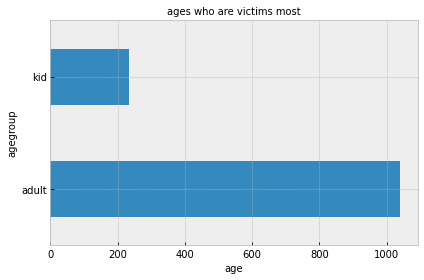

In [41]:
#create a bar chart using mathplotlib
fs = 10
plt.style.use("bmh")
fig = plt.figure()

ax0 = plt.subplot(1, 1, 1)
new['agegroup'].value_counts().plot(kind="barh", ax=ax0)
ax0.set_xlabel("age", fontsize=fs)
ax0.set_ylabel("agegroup", fontsize=fs)
ax0.tick_params(axis='both', labelsize=fs)
ax0.tick_params(axis='x', labelrotation=00)
ax0.set_title("ages who are victims most", fontsize=fs)
plt.tight_layout()

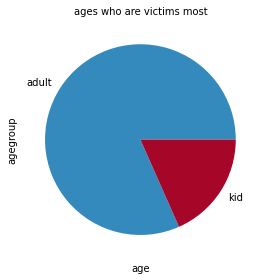

In [42]:
#make a nice pie using mathplotlib oveer ages and agegroup
fs = 10
plt.style.use("bmh")
fig = plt.figure()

ax0 = plt.subplot(1, 1, 1)
new['agegroup'].value_counts().plot(kind="pie", ax=ax0)
ax0.set_xlabel("age", fontsize=fs)
ax0.set_ylabel("agegroup", fontsize=fs)
ax0.tick_params(axis='both', labelsize=fs)
ax0.tick_params(axis='x', labelrotation=00)
ax0.set_title("ages who are victims most", fontsize=fs)
plt.tight_layout()

In [43]:
#showing this code gives us an impress of what type of attacks are most common
#suprise to see the most attacks are unprovoked
cause = df.groupby(["type"]).agg({"type":"count"})
cause = cause.rename(columns={"type": "count"})
cause = cause.sort_values("count", ascending=False)
print(cause.sum())
cause

count    1277
dtype: int64


,count
type,
unprovoked,1088
provoked,157
boating,20
sea disaster,6
boat,4
invalid,2


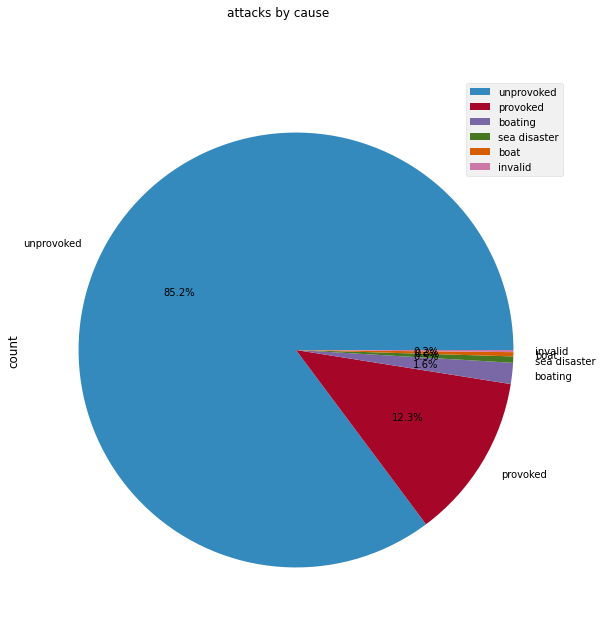

In [44]:
#showing the multiple stats below you can see clearly the difference of unprovoked and unprovoked attacks
cause.plot(title = "attacks by cause", kind = "pie", autopct='%1.1f%%', subplots=True, figsize = (20,10))
plt.show()

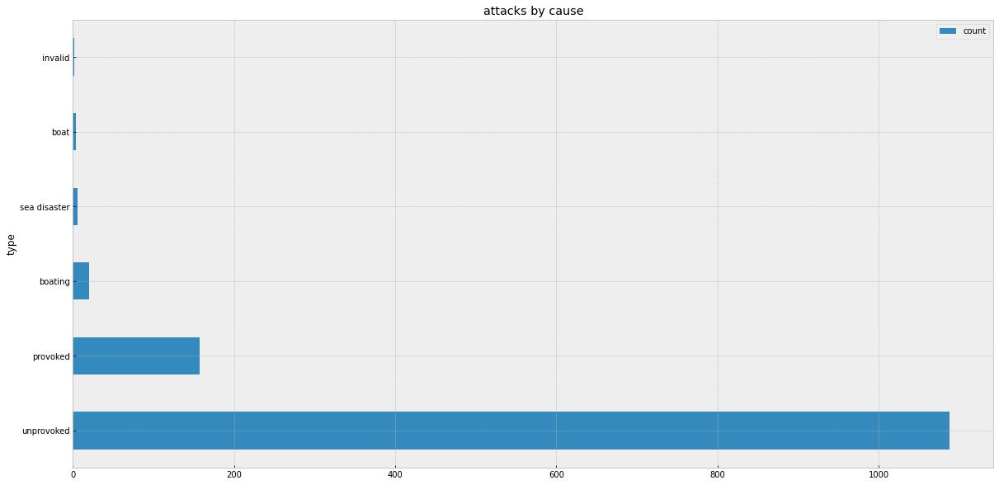

In [45]:
# plot a Bar Chart using matplotlib
cause.plot(
    xlabel = 'type',
    ylabel = 'count',
    kind = 'barh',
    figsize = (20,10),
    stacked = True,
    title = 'attacks by cause',
    mark_right = True)

In [46]:
import statsmodels.api as sm
from string import ascii_lowercase as letters
#we filter activities with more than 1 attack to reduce the big list
#this information shows clearly that surfing activities is far more risky then other activities
activity = pd.crosstab(index=df.activity[df.activity!="unknown"], columns=df["fatal (y/n)"]).sort_values("y",ascending=False)
activity = activity[activity.y>1]
activity

fatal (y/n),n,y
activity,,
swimming,106,60
surfing,274,23
spearfishing,113,17
body boarding,25,10
snorkeling,33,8
scuba diving,32,7
swimming,6,6
free diving,10,3
standing,14,3


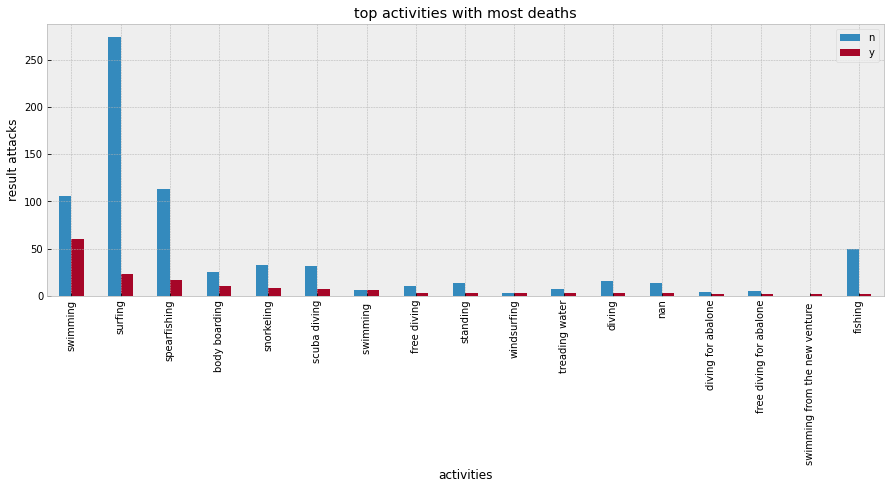

In [47]:
#as well as in the countries chart, this graph allows us to check the big difference of risk you have
#of been attacked by a shark and be killed by it
#1 a surprising fact is the surfing column; although it is, with difference, the most dangerous activity
#the surfers has less probabilities to die in a sharck attack than swimmers
activity[activity.y>0].plot(title = "top activities with most deaths", xlabel='activities', ylabel='result attacks', kind = "bar", figsize = (15,5))
plt.legend()

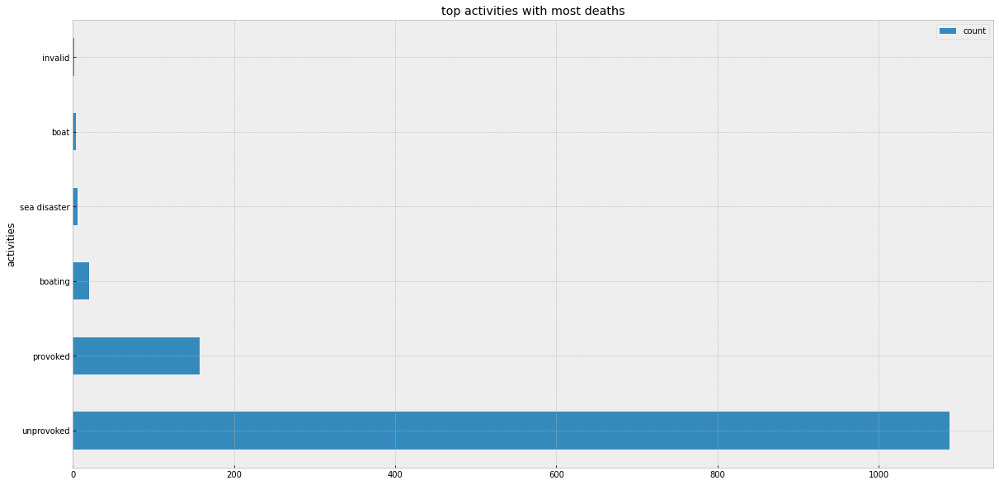

In [48]:
#create a bar chart using mathplotlib
cause.plot(
    xlabel = 'activities',
    ylabel = 'result attacks',
    kind = 'barh',
    figsize = (20,10),
    stacked = True,
    title = 'top activities with most deaths',
    mark_right = True)

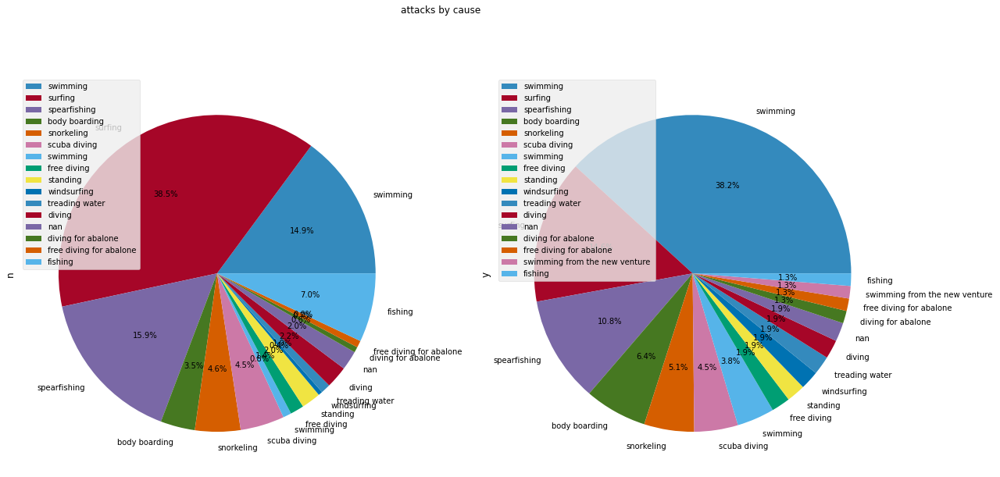

In [49]:
#this pie plot also show the difference of attacks and activities what comes with it
activity.plot(title = "attacks by cause", kind = "pie", autopct='%1.1f%%', subplots=True, figsize = (20,10))
plt.show()

In [50]:
#Here you see allot of information and plots showing the differences in this assignment, hopefully i can help other people with it.